# Notebook 2
# Data and feature evaluation

1. Visual inspection of data by creating an video of all acquired landmarks and features
2. Distribution of the features
3. Pairplots

Not all plots are used in the report


<div>
<img src="pose_landmarks_index.png" width="400"/>
</div>

In [ ]:
!pip install mediapipe

In [33]:
import numpy as np
import cv2
import mediapipe as mp
import random
import math
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from pathlib import Path

 # routines for this assignement 
import pose_ml  as pml  


# Get the features and actions data structure

In [34]:
#get features
features  = pml.FEATURES
feature_descriptions = pml.FEATURE_DESCRIPTIONS

# get the actions
actions = pml.ACTIONS
action_descriptions = pml.ACTION_DESCRIPTIONS

print("Features: ")
for key, feature in feature_descriptions.items():
    print(key, feature)
print("\nActions: ")
for key, action in action_descriptions.items():
    print(key, action)


Features: 
(0, 2) nose, left eye
(0, 5) nose, right eye
(0, 7) nose, left ear
(0, 8) nose, right ear
(0, 9) nose, left mouth
(0, 10) nose, right mouth
(0, 11) nose, left shoulder
(0, 12) nose, right shoulder
(2, 5) left eye, right eye
(2, 7) left eye, left ear
(5, 8) right eye, right ear
(7, 8) left ear, right ear
(7, 9) left ear, left mouth
(7, 11) left ear, left shoulder
(8, 10) right ear, right mouth
(8, 12) right ear, right shoulder
(9, 10) left mouth, right mouth
(9, 11) left mouth, left shoulder
(10, 12) right mouth, right shoulder
(11, 12) left shoulder, right shoulder

Actions: 
C MIDDEN
TL LINKS BOVEN
TR RECHTS BOVEN
BL LINKS ONDER
BR RECHTS ONDER


set initial path's and other parameters

In [35]:
project_data = Path(r"./data")
graph_path = Path(r"./graphs")
model_path = Path(r"./models")
sns.set(style="whitegrid")
color = ["Blue", "Red", "Yellow", "Green", "Grey"] 
sns.set_palette(color) 
img_size = (256, 256)
gray_bg = 225

# Visualization of the dataset

Draw and display a specific sample from the dataset


In [ ]:
image = np.full((img_size[0], img_size[1], 3), gray_bg, dtype=np.uint8)

# for the report following files are used:
# wrong action: r"r"person_0012\TR\0\10.npy 
# no body movement r"person_0003\TR\0\30.npy"
file= project_data / Path(r"person_0000\TR\0\30.npy")
print(file)
data = pml.read_file(str(file))
dist = pml.calculate_distance(data)
pml.draw_features(image,data)
pml.draw_direction(image,actions.index("TR"))
cv2.imshow("Data Points Visualization:", image)
cv2.waitKey(0)
cv2.destroyAllWindows()

data\person_0000\TR\0\30.npy


## Load data 
This loads data from the directory structure. Skip this if you do not use the original dataset

In [39]:
# Load the data_set
persons, samples, labels,  raw_data= pml.read_data(project_data)
print(f"Number of samples: {len(samples)} and labels {len(labels)}")

Number of samples: 15000 and labels 15000


This routine shows the samples as a movie.
Use this for visual inspection of the data.

In [20]:
sample_nr = 0 
img_size = (768,768)
for sample, lbl, p_id in zip(raw_data,labels, persons):
    image = np.full((img_size[0], img_size[1], 3), gray_bg, dtype=np.uint8)
    cv2.putText(image, f'Person:{p_id}, sample:{sample_nr:4d}, action: {action_descriptions[actions[lbl]]}', (20, 30),
                            cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 1, cv2.LINE_AA)

    pml.draw_features(image, sample)
    pml.draw_direction(image, lbl)
   
    cv2.imshow("Data Points Visualization:", image)
    if cv2.waitKey(5) & 0xff == ord('q'):
        flag = True
        break
    sample_nr+=1
cv2.destroyAllWindows()


This routine creates a movie.
It is similar to the routine above, but only saves it and does not display it. This due to time limits.

In [21]:
sample_nr = 0 
# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Be sure to use lower case
video = cv2.VideoWriter("features_final.mp4", fourcc, 50.0, img_size)


for sample, lbl, p_id in zip(raw_data,labels, persons):
    image = np.full((img_size[0], img_size[1], 3), gray_bg, dtype=np.uint8)
    cv2.putText(image, f'Person:{p_id}, sample:{sample_nr:4d}, action: {action_descriptions[actions[lbl]]}', (20, 30),
                            cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 1, cv2.LINE_AA)

 
    pml.draw_features(image, sample)
    pml.draw_direction(image, lbl)
    video.write(image)
    if sample_nr % 500 == 0:
        print(sample_nr)
    sample_nr+=1


video.release()
cv2.destroyAllWindows()

# Optionally, save the image
# cv2.imwrite('output_image.png', image)

0
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500
11000
11500
12000
12500
13000
13500
14000
14500


# Statistics

## Load the dataset and create a pandas dataframe and store it.
Do not run if you do not want to reconstruct the data


In [40]:
_, samples, labels,  _= pml.read_data(project_data)
print(f"Number of samples: {len(samples)} , and labels {len(labels)}")

Number of samples: 15000 , and labels 15000


In [67]:
df = pd.DataFrame(samples, columns = features)
df['action_id'] =  labels
df['action'] = df['action_id'].map({0: 'C', 1: 'TL', 2: 'TR', 3: 'BL', 4: 'BR'})
pml.inspect_data(df)

#write for further usage
df.to_csv(project_data / Path("data_pose.csv"))


Index([     (0, 2),      (0, 5),      (0, 7),      (0, 8),      (0, 9),
           (0, 10),     (0, 11),     (0, 12),      (2, 5),      (2, 7),
            (5, 8),      (7, 8),      (7, 9),     (7, 11),     (8, 10),
           (8, 12),     (9, 10),     (9, 11),    (10, 12),    (11, 12),
       'action_id',    'action'],
      dtype='object')


## Run from here with the loaded data
Since we work with tupples and the CSV is using strings a conversion to tuples is necessary

In [75]:
df = pd.read_csv(project_data / Path("data_pose.csv"), index_col=0 )
newidx= [eval(idx)  if isinstance(idx, str) and idx != 'action' and idx != 'action_id' else idx for idx in df[:19].columns]
df.columns  = newidx
df.head()

,"(0, 2)","(0, 5)","(0, 7)","(0, 8)","(0, 9)","(0, 10)","(0, 11)","(0, 12)","(2, 5)","(2, 7)",...,"(7, 9)","(7, 11)","(8, 10)","(8, 12)","(9, 10)","(9, 11)","(10, 12)","(11, 12)",action_id,action
0,0.036319,0.032821,0.039776,0.032249,0.042654,0.041091,0.217222,0.223023,0.043141,0.021738,...,0.056458,0.214309,0.047389,0.218441,0.029466,0.174843,0.181957,0.181902,0,C
1,0.036420,0.033009,0.039860,0.032261,0.042655,0.041129,0.216905,0.223498,0.043234,0.021651,...,0.056673,0.214219,0.047472,0.218970,0.029616,0.174524,0.182394,0.182629,0,C
2,0.036302,0.032992,0.039802,0.032151,0.042677,0.041177,0.216880,0.224879,0.043054,0.021610,...,0.056745,0.214288,0.047462,0.220301,0.029561,0.174481,0.183730,0.183347,0,C
3,0.036185,0.032885,0.039752,0.031982,0.042676,0.041180,0.216995,0.226607,0.042880,0.021572,...,0.056757,0.214431,0.047380,0.221977,0.029443,0.174601,0.185458,0.184031,0,C
4,0.036062,0.032767,0.039624,0.031919,0.042632,0.041242,0.217171,0.228480,0.042707,0.021516,...,0.056761,0.214724,0.047292,0.223689,0.029324,0.174826,0.187269,0.184707,0,C


## mean and standard deviations of features

In [73]:
for feature in features:
    #print(features_desc(feature))
    print (f"feature: {features.index(feature)}, mean { df[feature].mean():.5f},",
           f"std {df[feature].std(ddof=1):.5f}, {feature_descriptions[feature]}")


feature: 0, mean 0.04026, std 0.01000, nose, left eye
feature: 1, mean 0.03903, std 0.01009, nose, right eye
feature: 2, mean 0.04406, std 0.01771, nose, left ear
feature: 3, mean 0.04302, std 0.01732, nose, right ear
feature: 4, mean 0.04364, std 0.00851, nose, left mouth
feature: 5, mean 0.04404, std 0.00780, nose, right mouth
feature: 6, mean 0.22328, std 0.04783, nose, left shoulder
feature: 7, mean 0.23235, std 0.04743, nose, right shoulder
feature: 8, mean 0.03829, std 0.00716, left eye, right eye
feature: 9, mean 0.03011, std 0.00971, left eye, left ear
feature: 10, mean 0.03039, std 0.01037, right eye, right ear
feature: 11, mean 0.07369, std 0.01315, left ear, right ear
feature: 12, mean 0.06165, std 0.01729, left ear, left mouth
feature: 13, mean 0.22078, std 0.04160, left ear, left shoulder
feature: 14, mean 0.06020, std 0.01735, right ear, right mouth
feature: 15, mean 0.22979, std 0.03911, right ear, right shoulder
feature: 16, mean 0.02880, std 0.00584, left mouth, right 

Normalize the data

In [8]:
# Normalize data
for feature in features:
    df[feature] = (df[feature]-df[feature].mean())/df[feature].std(ddof=1)

Check the normalization

In [9]:
for feature in features:
    #print(features_desc(feature))
    print (f"feature: {features.index(feature)}, mean { df[feature].mean():.5f},",
           f"std {df[feature].std(ddof=1):.5f}, {feature_descriptions[feature]}")


feature: 0, mean 0.00000, std 1.00000, nose, left eye
feature: 1, mean 0.00000, std 1.00000, nose, right eye
feature: 2, mean 0.00000, std 1.00000, nose, left ear
feature: 3, mean -0.00000, std 1.00000, nose, right ear
feature: 4, mean 0.00000, std 1.00000, nose, left mouth
feature: 5, mean -0.00000, std 1.00000, nose, right mouth
feature: 6, mean -0.00000, std 1.00000, nose, left shoulder
feature: 7, mean -0.00000, std 1.00000, nose, right shoulder
feature: 8, mean -0.00000, std 1.00000, left eye, right eye
feature: 9, mean 0.00000, std 1.00000, left eye, left ear
feature: 10, mean -0.00000, std 1.00000, right eye, right ear
feature: 11, mean 0.00000, std 1.00000, left ear, right ear
feature: 12, mean -0.00000, std 1.00000, left ear, left mouth
feature: 13, mean -0.00000, std 1.00000, left ear, left shoulder
feature: 14, mean -0.00000, std 1.00000, right ear, right mouth
feature: 15, mean -0.00000, std 1.00000, right ear, right shoulder
feature: 16, mean -0.00000, std 1.00000, left mo

## Plot the distributions of the features

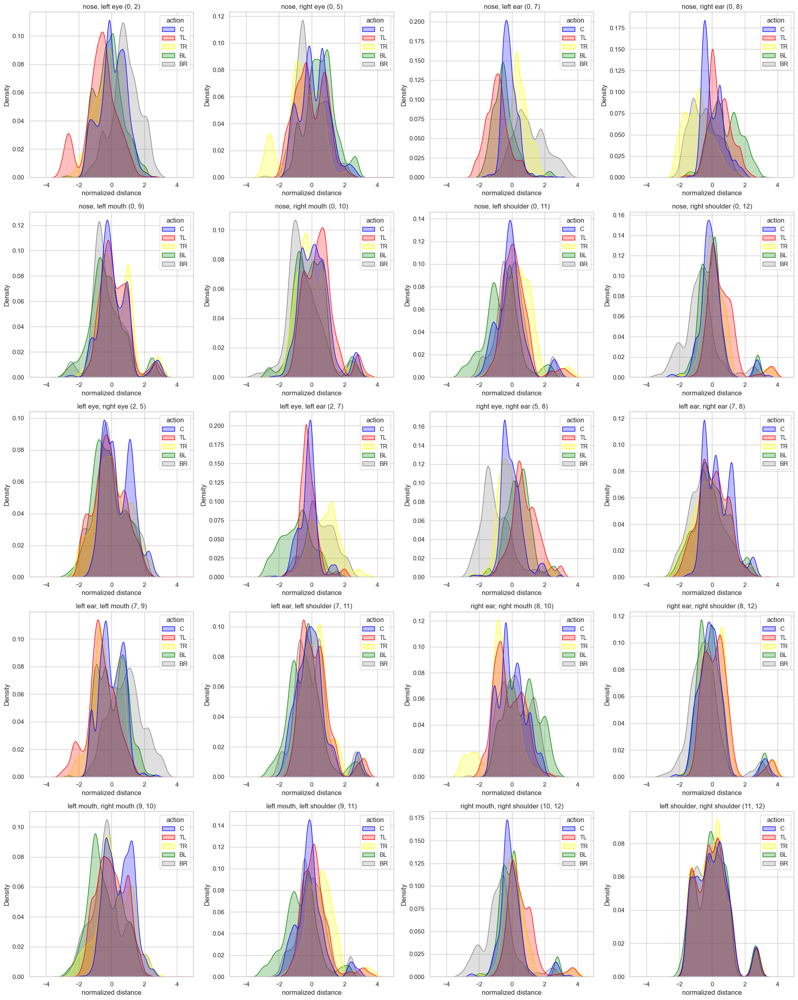

In [10]:
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # Adjusting the figure size for better readability
axs = axs.flatten()  # Flatten to iterate easily

max_feature_value = (df[features].max()).max()
max_x_axes = math.ceil(max_feature_value/10)*10
# Plotting
for i, feature in enumerate(df[features]):  # Excluding the label column
    #sns.histplot(data=df, x=feature, hue="action",  ax=axs[i], kde=True, bins = 20)
    sns.kdeplot(data=df, x=feature, hue="action", ax=axs[i], fill=True)  # fill=True for area under the KDE
  
    axs[i].set_title(feature_descriptions[features[i]]+' '+ str(feature))
    axs[i].set_xlabel("normalized distance")
    axs[i].set_xlim(-5, 5)

# Hide the empty subplots if less then 20
for i in range(len(features), 20):
    fig.delaxes(axs[i])
    
plt.savefig(str(graph_path / Path('normalized_distributions.png')))

plt.tight_layout()
plt.show()


In [11]:
# Define a mapping function for the actions
def map_TB(action):
    if action in ['TL', 'TR']:
        return 'T'
    elif action in ['BL', 'BR']:
        return 'B'
    # elif action == 'C':
    #     return 'C'
    else:
        return 'Other'
    
def map_LR(action):
    if action in ['TL', 'BL']:
        return 'L'
    elif action in ['TR', 'BR']:
        return 'R'
    # elif action == 'C':
    #     return 'C'
    else:
        return 'Other'
df_f = df[df['action'] != 'C']
# Apply the mapping function to create a new column
df_f['T-B'] = df_f['action'].apply(map_TB)
df_f['L-R'] = df_f['action'].apply(map_LR)


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\3482680941.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_f['T-B'] = df_f['action'].apply(map_TB)
C:\Users\djase\AppData\Local\Temp\ipykernel_31088\3482680941.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_f['L-R'] = df_f['action'].apply(map_LR)


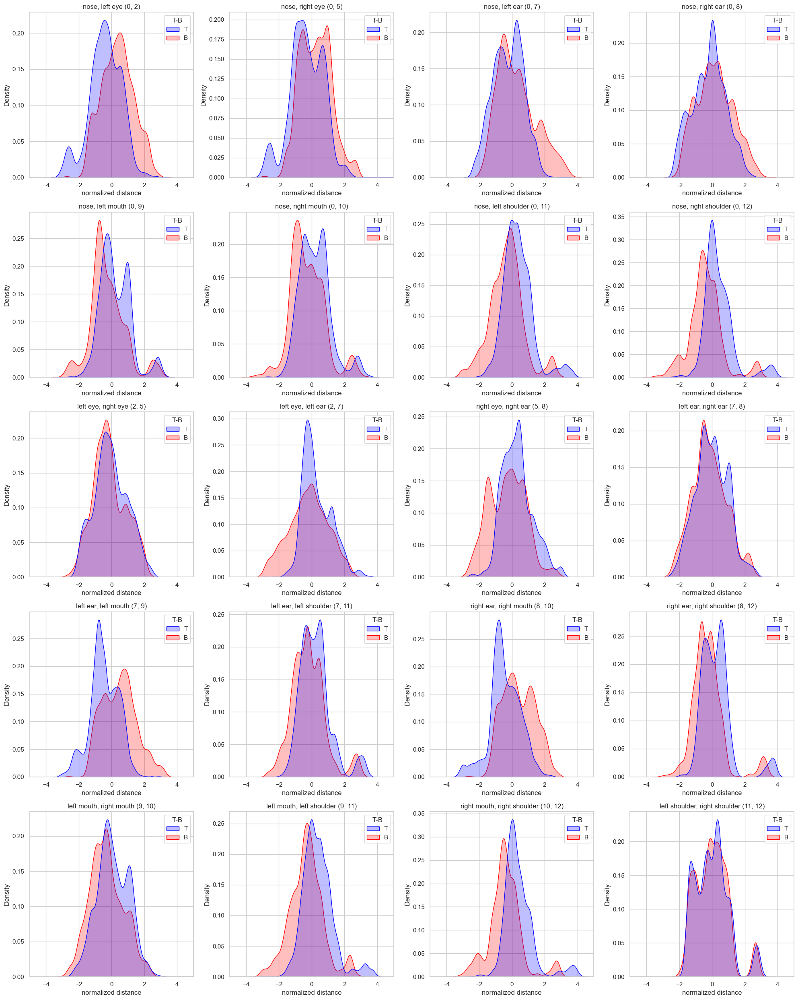

In [12]:
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # Adjusting the figure size for better readability
axs = axs.flatten()  # Flatten to iterate easily

max_feature_value = (df_f[features].max()).max()
max_x_axes = math.ceil(max_feature_value/10)*10
# Plotting
for i, feature in enumerate(df_f[features]):  # Excluding the label column
    #sns.histplot(data=df, x=feature, hue="action",  ax=axs[i], kde=True, bins = 20)
    sns.kdeplot(data=df_f, x=feature, hue="T-B", ax=axs[i], fill=True)  # fill=True for area under the KDE
  
    axs[i].set_title(feature_descriptions[features[i]]+' '+ str(feature))
    axs[i].set_xlabel("normalized distance")
    axs[i].set_xlim(-5, 5)

# Hide the empty subplots if less then 20
for i in range(len(features), 20):
    fig.delaxes(axs[i])

plt.savefig(str(graph_path / Path('normalized_distributions-T-B.png')))

plt.tight_layout()
plt.show()

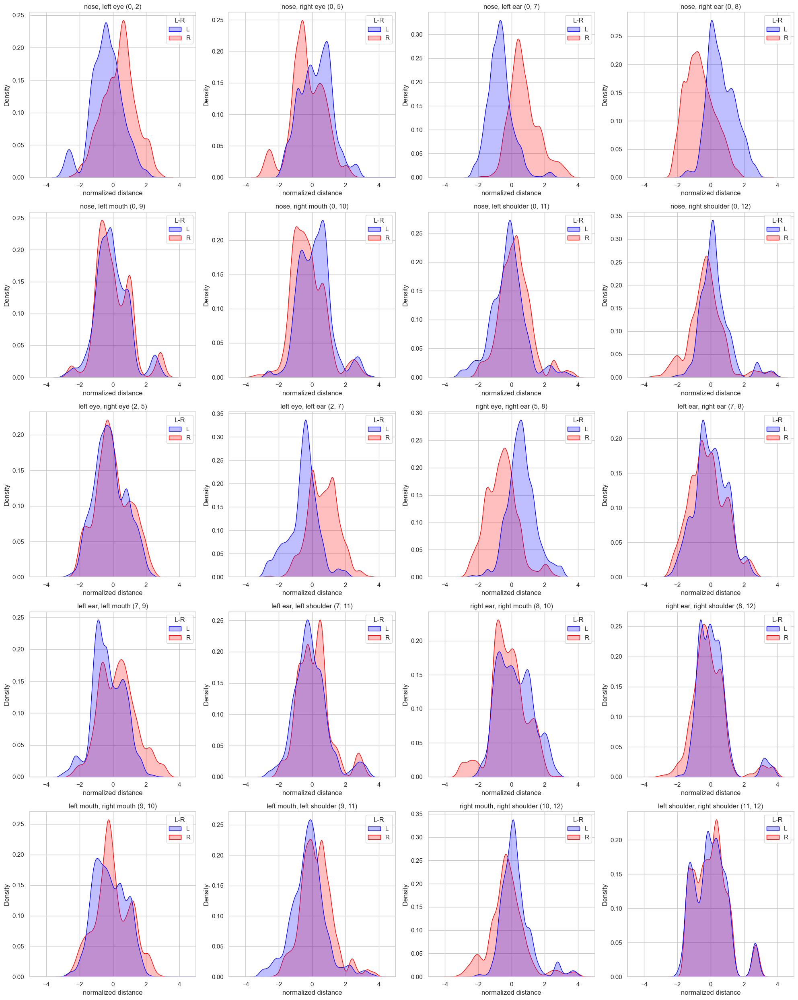

In [13]:
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # Adjusting the figure size for better readability
axs = axs.flatten()  # Flatten to iterate easily

max_feature_value = (df_f[features].max()).max()
max_x_axes = math.ceil(max_feature_value/10)*10
# Plotting
for i, feature in enumerate(df_f[features]):  # Excluding the label column
    #sns.histplot(data=df, x=feature, hue="action",  ax=axs[i], kde=True, bins = 20)
    sns.kdeplot(data=df_f, x=feature, hue="L-R", ax=axs[i], fill=True)  # fill=True for area under the KDE
  
    axs[i].set_title(feature_descriptions[features[i]]+' '+ str(feature))
    axs[i].set_xlabel("normalized distance")
    axs[i].set_xlim(-5, 5)

# Hide the empty subplots if less then 20
for i in range(len(features), 20):
    fig.delaxes(axs[i])

plt.savefig(str(graph_path / Path('normalized_distributions-L-R.png')))

plt.tight_layout()
plt.show()

## Plot pairplots of some interesting combinations fo features

In [14]:
def plot_pairplot(selected_features, file_name = ""):

    title_str="Pairplot of features:" + " / ".join({feature_descriptions[i] for i in selected_features})
    title_str=title_str.replace(", ", " -> ")

    print(title_str)
    short_df =df[selected_features + ['action']]
    original_columns = df.columns
    string_columns = {col: str(col) if isinstance(col, tuple) else col for col in short_df.columns}
    short_df.rename(columns=string_columns, inplace=True)
    fig = sns.pairplot(short_df, hue="action", plot_kws={'alpha': 0.5})#, palette="bright")

    for i, ax in enumerate(fig.axes.flat):
        if i % len(selected_features) == 0:  # Y-axis labels (left side)
            ax.set_ylabel(feature_descriptions[selected_features[i // len(selected_features)]])
        if i >= len(selected_features) * (len(selected_features) - 1):  # X-axis labels (bottom)
            ax.set_xlabel(feature_descriptions[selected_features[i % len(selected_features)]])
    plt.suptitle(title_str)
    plt.subplots_adjust(top=0.95)
    #plt.title(f"Pairplot of features {feature_descriptions[i] + ' ' for i in selected_features}  ")
    if file_name:
        plt.savefig(str(graph_path / Path(file_name+'.png')))
    plt.show()


In [15]:
def plot_pairplot_sub(selected_features, sub_str, file_name = ""):

    title_str="Pairplot of features:" + " / ".join({feature_descriptions[i] for i in selected_features})
    title_str=title_str.replace(", ", " -> ")

    print(title_str)
    short_df =df_f[selected_features + [sub_str]]
    original_columns = df_f.columns
    string_columns = {col: str(col) if isinstance(col, tuple) else col for col in short_df.columns}
    short_df.rename(columns=string_columns, inplace=True)
    fig = sns.pairplot(short_df, hue=sub_str, plot_kws={'alpha': 0.1})#, palette="bright")

    for i, ax in enumerate(fig.axes.flat):
        if i % len(selected_features) == 0:  # Y-axis labels (left side)
            ax.set_ylabel(feature_descriptions[selected_features[i // len(selected_features)]])
        if i >= len(selected_features) * (len(selected_features) - 1):  # X-axis labels (bottom)
            ax.set_xlabel(feature_descriptions[selected_features[i % len(selected_features)]])
    plt.suptitle(title_str)
    plt.subplots_adjust(top=0.95)
    #plt.title(f"Pairplot of features {feature_descriptions[i] + ' ' for i in selected_features}  ")
    if file_name:
        plt.savefig(str(graph_path / Path(file_name+'.png')))
    plt.show()


Pairplot of features:right ear -> right mouth / right mouth -> right shoulder / left mouth -> left shoulder / left ear -> left mouth


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\3903887673.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df.rename(columns=string_columns, inplace=True)


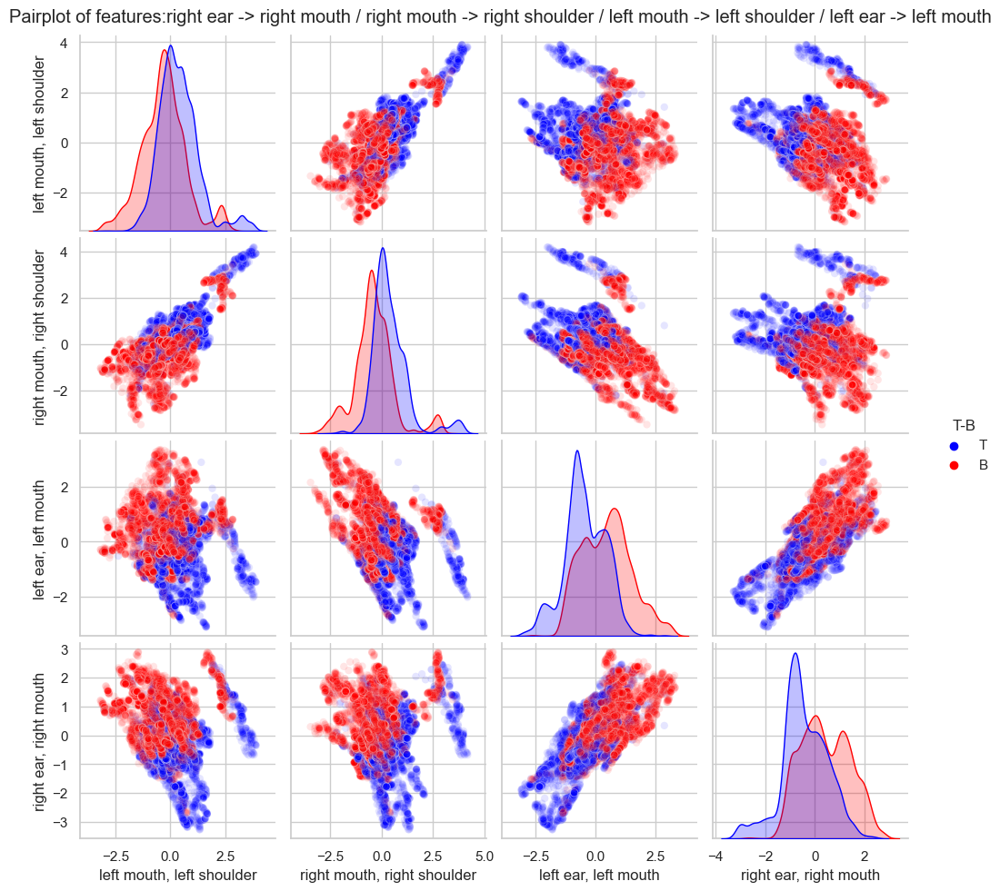

In [18]:
# LEFT EAR -> LEFT MOUTH
# RIGHT EAR -> RIGHT MOUTH
# LEFT MOUTH -> LEFT SHOULDER
# RIGHT MOUTH -> RIGHT SHOULDER

selected_features = [(9,11),(10,12),(7, 9),(8,10)]
plot_pairplot_sub(selected_features, "T-B", "T_B_EAR_MOUTHS_SHOULDER")

Pairplot of features:nose -> left eye / nose -> left ear / nose -> right ear / nose -> right eye


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\3903887673.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df.rename(columns=string_columns, inplace=True)


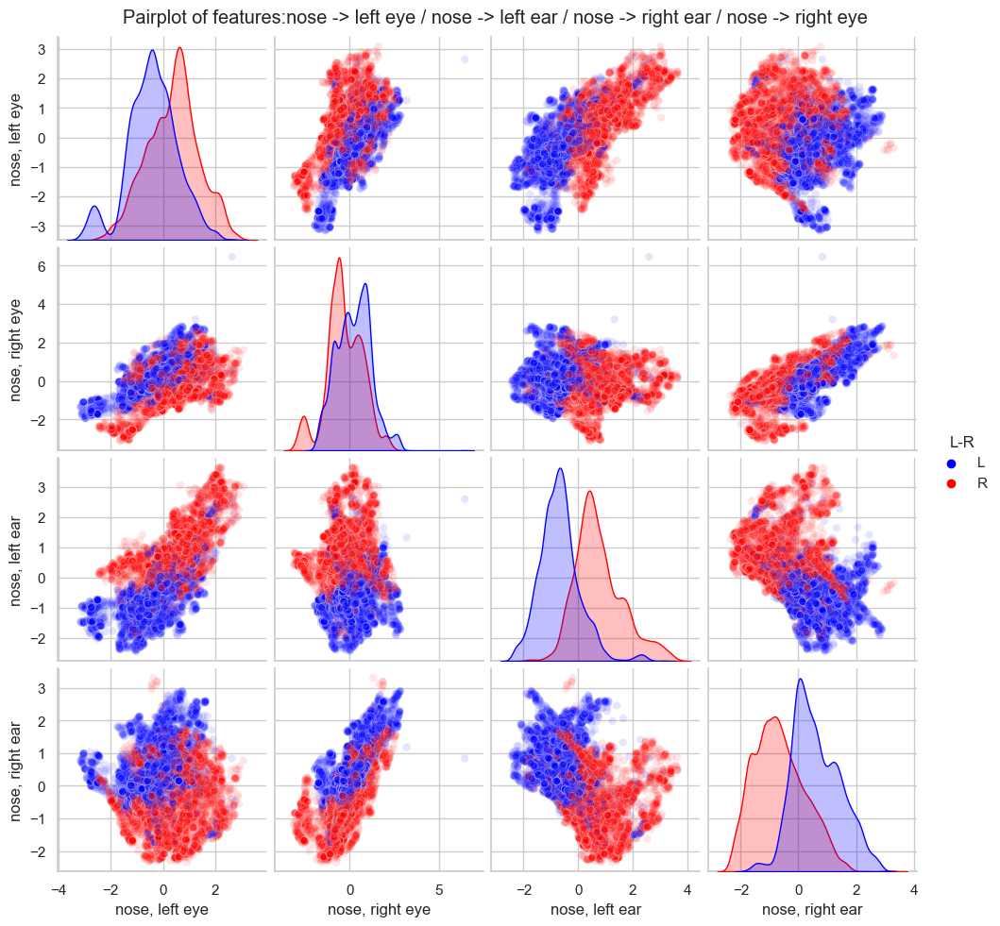

In [19]:
# NOSE -> RIGHT EAR
# NOSE -> RIGHT EYE
# NOSE -> LEFT EAR
# NOSE -> LEFT EYE

selected_features = [(0,2),(0,5),(0,7),(0,8)]
plot_pairplot_sub(selected_features, "L-R", "L_R_EAR-NOSE-EYE")

Pairplot of features:nose -> left eye / nose -> left ear / right ear -> right mouth / nose -> right ear / left mouth -> left shoulder / left ear -> left mouth / nose -> right eye / right mouth -> right shoulder


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\1778485482.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df.rename(columns=string_columns, inplace=True)


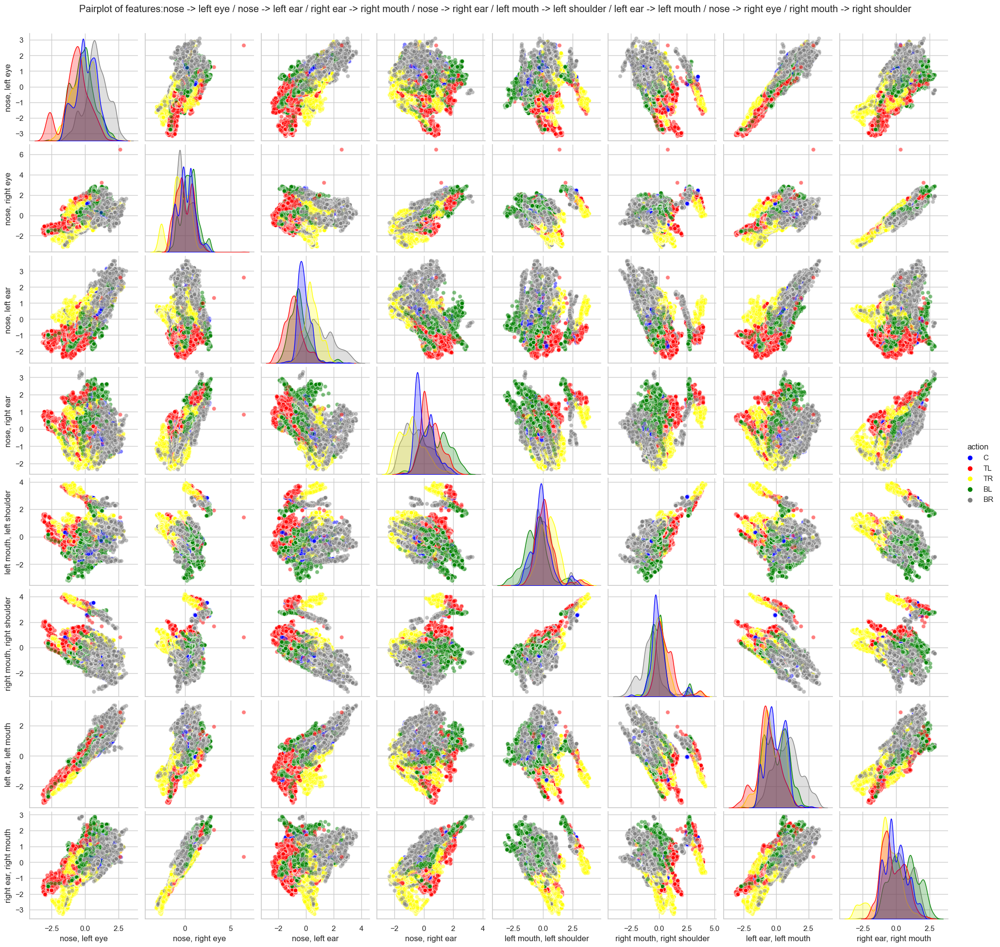

In [20]:
# LEFT EAR -> LEFT MOUTH
# RIGHT EAR -> RIGHT MOUTH
# LEFT MOUTH -> LEFT SHOULDER
# RIGHT MOUTH -> RIGHT SHOULDER
# NOSE -> RIGHT EAR
# NOSE -> RIGHT EYE
# NOSE -> LEFT EAR
# NOSE -> LEFT EYE
selected_features = [(0,2),(0,5),(0,7),(0,8), (9,11),(10,12),(7, 9),(8,10)]

plot_pairplot(selected_features, "L_R_T_B")

Pairplot of features:nose -> left eye / right ear -> right mouth / nose -> right eye / left ear -> left mouth


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\1778485482.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df.rename(columns=string_columns, inplace=True)


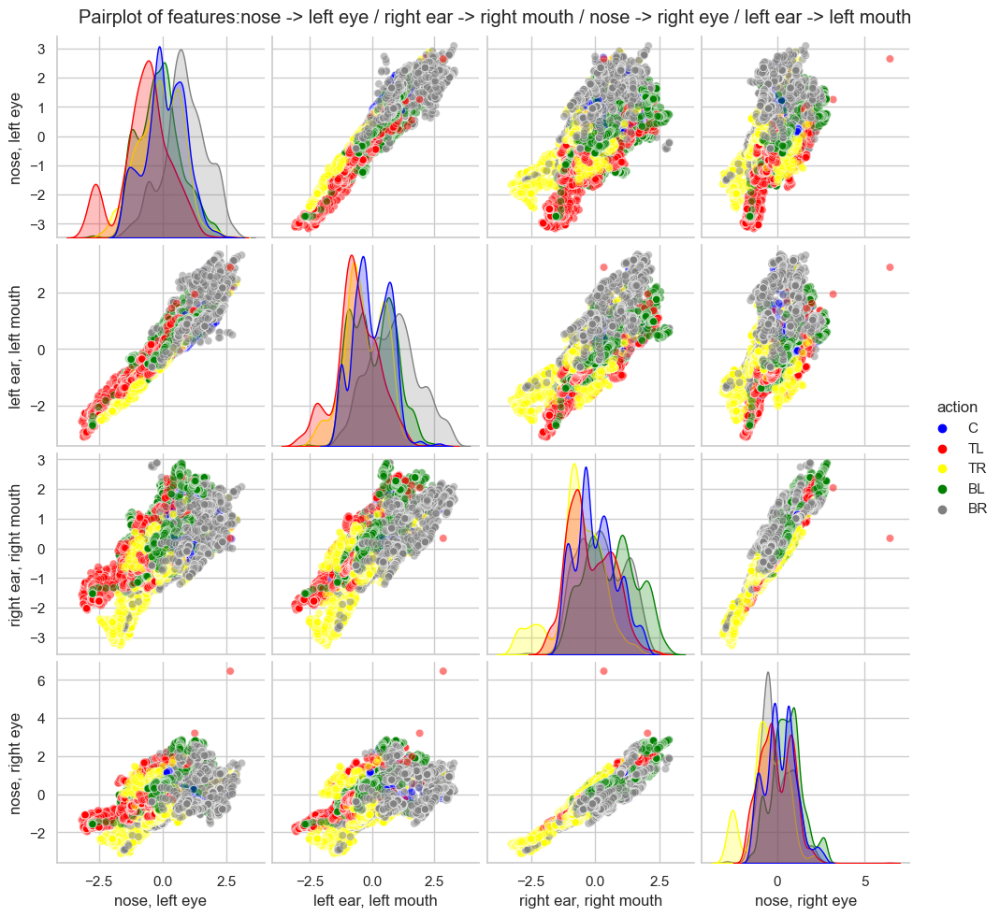

In [21]:
# LEFT EAR -> LEFT MOUTH
# NOSE -> RIGHT EYE
# RIGHT EAR -> RIGHT MOUTH
# NOSE -> LEFT EYE

selected_features = [(0,2),(7, 9),(8,10),(0,5)]
plot_pairplot(selected_features, "L_R_T_B_set1")



Pairplot of features:right mouth -> right shoulder / nose -> left ear / nose -> right ear / left mouth -> left shoulder


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\1778485482.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df.rename(columns=string_columns, inplace=True)


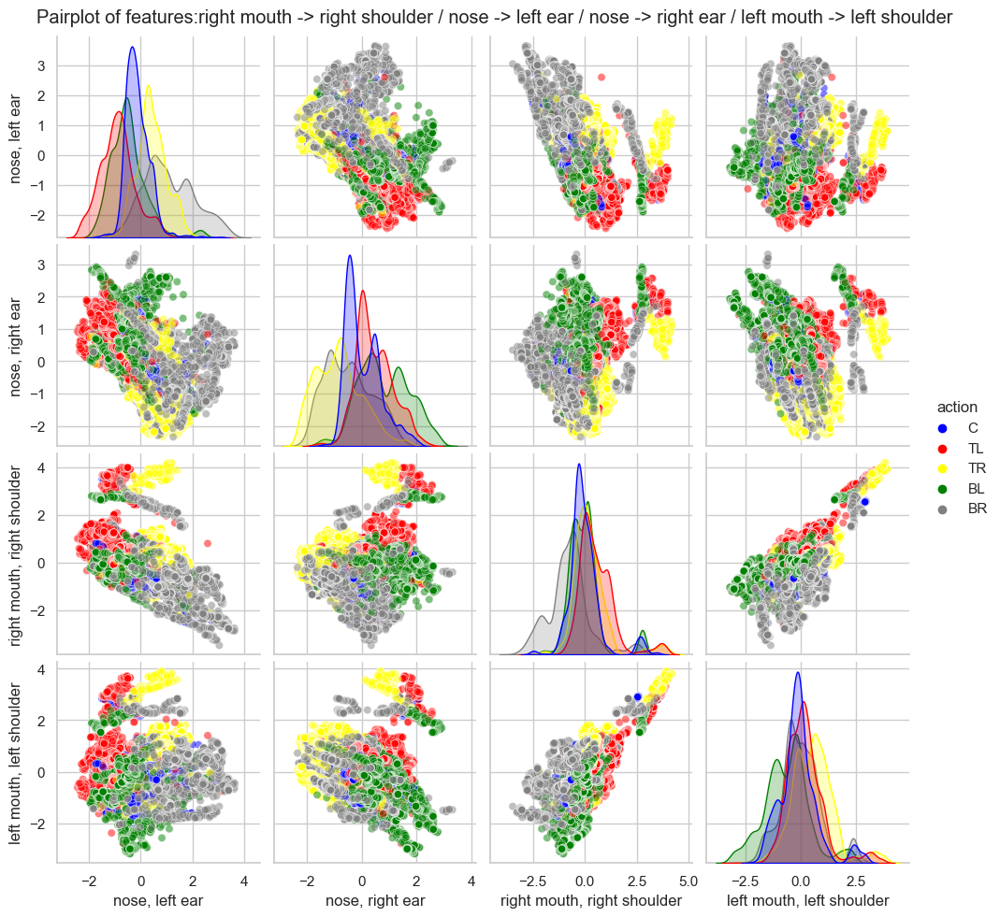

In [23]:
# RIGHT MOUTH -> RIGHT SHOULDER
# NOSE -> LEFT EAR
# NOSE -> RIGHT EAR
# LEFT MOUTH -> LEFT SHOULDER

selected_features = [(0,7),(0,8),(10,12), (9,11),]
plot_pairplot(selected_features, "L_R_T_B_set2")

Pairplot of features:nose -> left ear / right mouth -> right shoulder / left mouth -> left shoulder / nose -> right ear


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\1778485482.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df.rename(columns=string_columns, inplace=True)


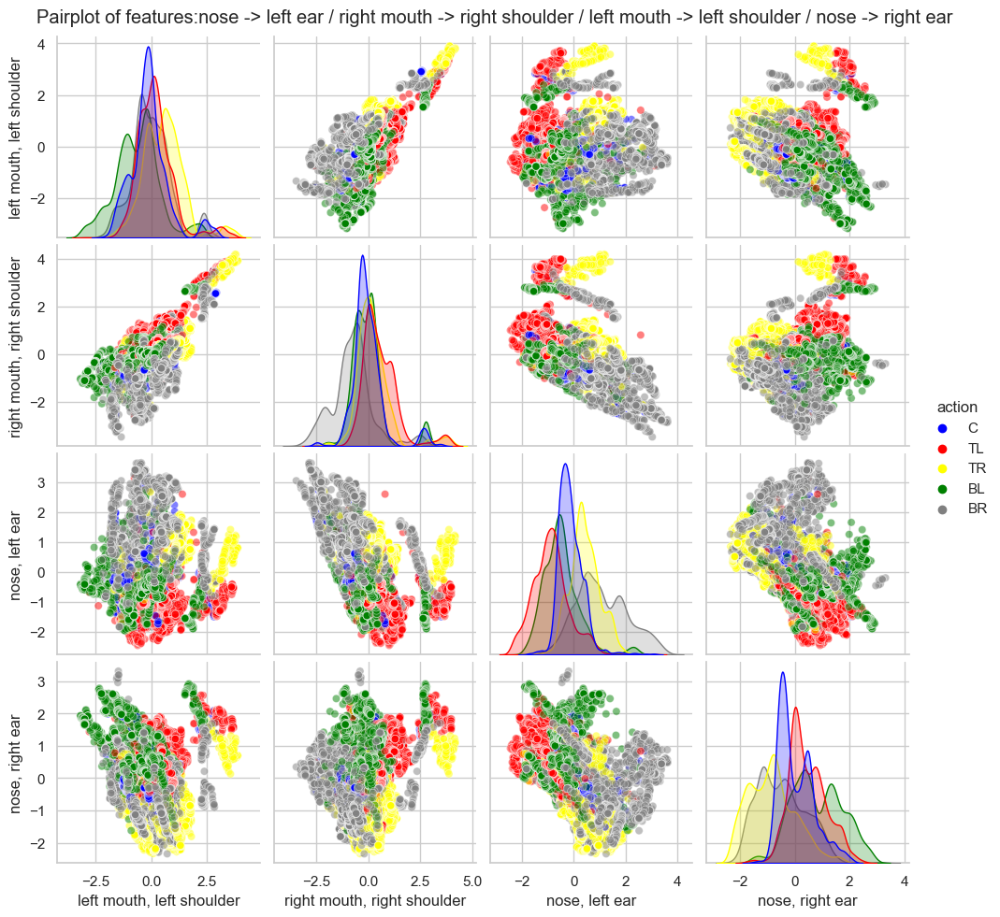

In [24]:
# NOSE -> LEFT EAR
# NOSE -> RIGHT EAR 
# LEFT MOUTH -> LEFT SHOULDER
# RIGHT MOUTH -> RIGHT SHOULDER
selected_features = [(9,11),(10,12),(0,7),(0,8)]
plot_pairplot(selected_features, "EAR_SHOULDER_NOSE_MOUTH")



Pairplot of features:nose -> left shoulder / nose -> left ear / nose -> right ear / nose -> right shoulder


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\1778485482.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df.rename(columns=string_columns, inplace=True)


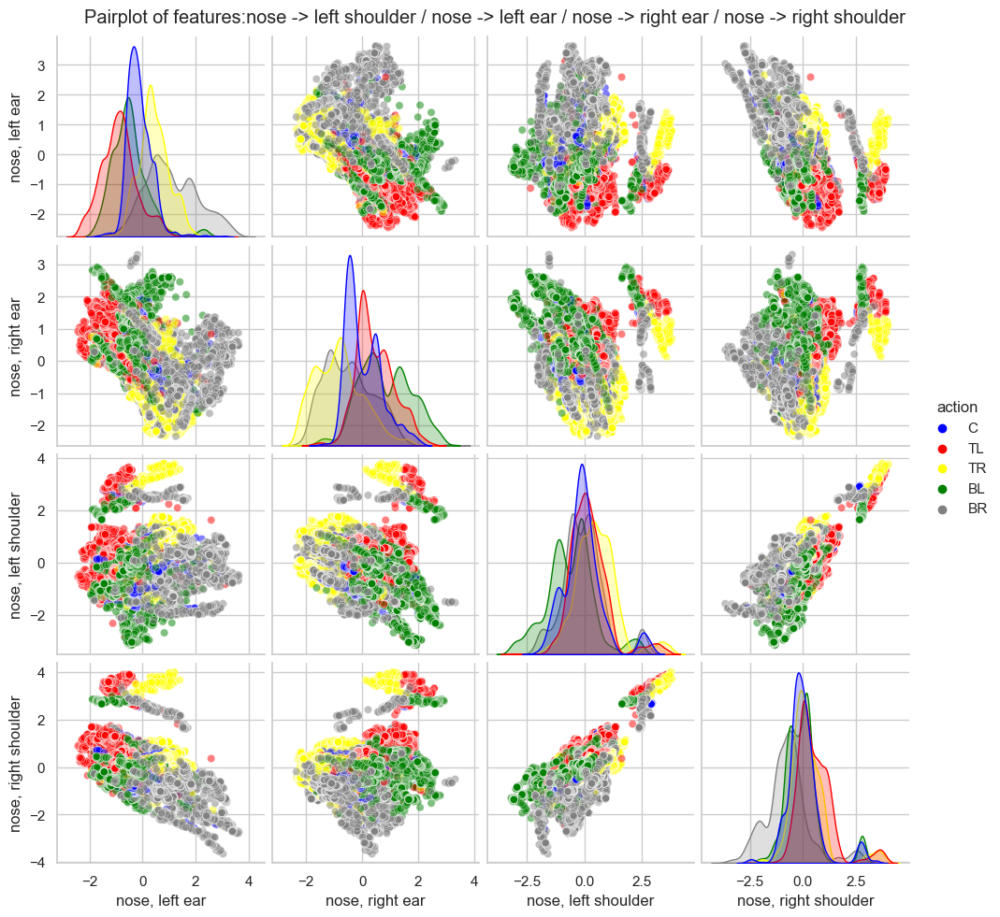

In [25]:
# LEFT EAR -> NOSE
# RIGHT EAR -> NOSE
# LEFT SHOULDER -> NOSE
# RIGHT SHOULDER -> NOSE
selected_features = [(0,7),(0,8),(0,11),(0,12)]
plot_pairplot(selected_features, "EAR_SHOULDER_NOSE")

Pairplot of features:left shoulder -> right shoulder / left ear -> right ear / left ear -> left shoulder / right ear -> right shoulder


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\1778485482.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df.rename(columns=string_columns, inplace=True)


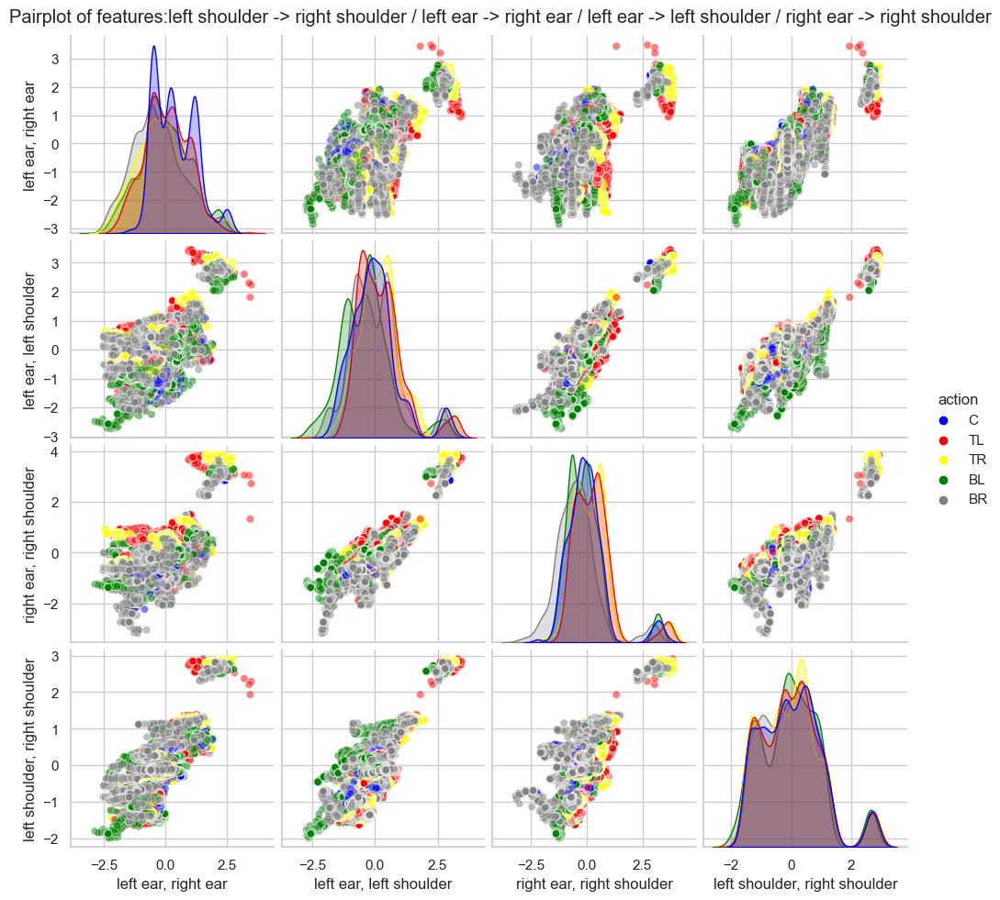

In [26]:
# LEFT EAR -> RIGHT EAR 
# LEFT EAR -> LEFT SHOULDER 
# RIGHT EAR -> RIGHT SHOULDER 
# LEFT SHOULDER -> RIGHT SHOULDER
selected_features = [(7,8), (7,11),(8,12),(11,12)]
plot_pairplot(selected_features, "EAR_SHOULDER")

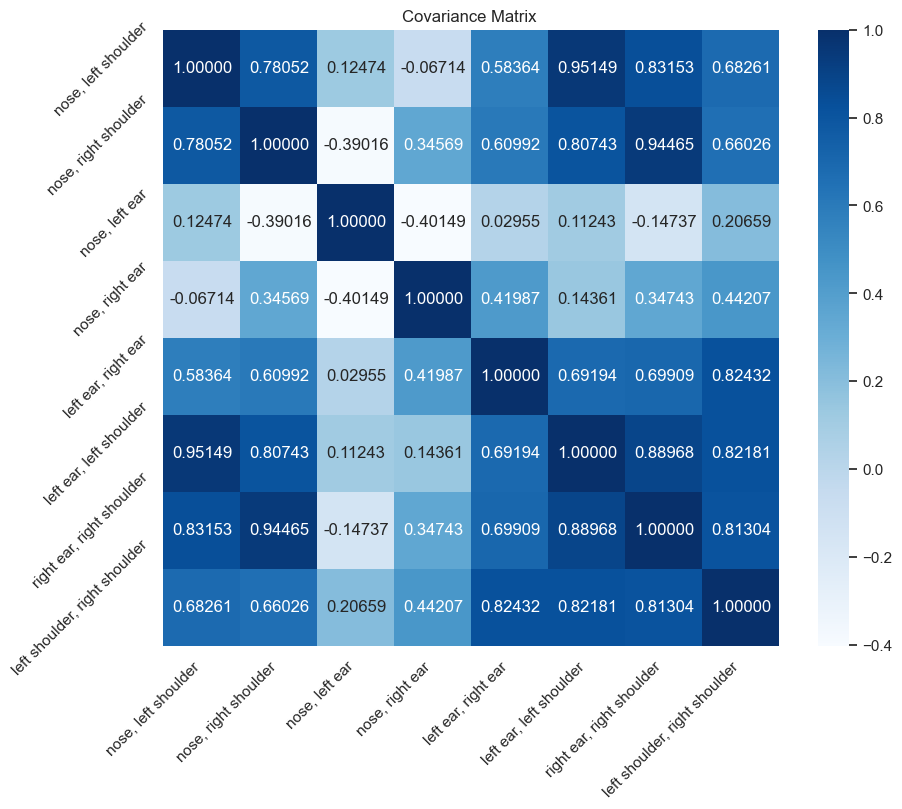

In [27]:
selected_features = [(0,11),(0,12),(0,7),(0,8),(7,8), (7,11),(8,12),(11,12)]
#selected_features = [(7,8), (7,11),(8,12),(11,12)]
#selected_features = features
cov_matrix= df[selected_features].cov()
feat_col = [feature_descriptions[i] for i in selected_features]
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
sns.heatmap(cov_matrix, annot=True, fmt=".5f", cmap="Blues", cbar=True, square=True,
            xticklabels=feat_col, yticklabels=feat_col)

# Enhancements for better readability
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=45)
plt.title(f'Covariance Matrix ')
plt.savefig(str(graph_path / Path('covariance_matrix_main_features.png')))
plt.show()

# MAPPING LEFT - RIGHT AND TOP - DOWN

In [29]:
# Define a mapping function for the actions
def map_TB(action):
    if action in ['TL', 'TR']:
        return 'T'
    elif action in ['BL', 'BR']:
        return 'B'
    # elif action == 'C':
    #     return 'C'
    else:
        return 'Other'
    
def map_LR(action):
    if action in ['TL', 'BL']:
        return 'L'
    elif action in ['TR', 'BR']:
        return 'R'
    # elif action == 'C':
    #     return 'C'
    else:
        return 'Other'
df_f = df[df['action'] != 'C']
# Apply the mapping function to create a new column
df_f['T-B'] = df_f['action'].apply(map_TB)
df_f['L-R'] = df_f['action'].apply(map_LR)


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\3482680941.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_f['T-B'] = df_f['action'].apply(map_TB)
C:\Users\djase\AppData\Local\Temp\ipykernel_31088\3482680941.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_f['L-R'] = df_f['action'].apply(map_LR)


In [30]:
# Define a mapping function for the actions
def map_TB(action):
    if action in ['TL', 'TR']:
        return 'T'
    elif action in ['BL', 'BR']:
        return 'B'
    # elif action == 'C':
    #     return 'C'
    else:
        return 'Other'
    
def map_LR(action):
    if action in ['TL', 'BL']:
        return 'L'
    elif action in ['TR', 'BR']:
        return 'R'
    # elif action == 'C':
    #     return 'C'
    else:
        return 'Other'
df_f = df[df['action'] != 'C']
# Apply the mapping function to create a new column
df_f['T-B'] = df_f['action'].apply(map_TB)
df_f['L-R'] = df_f['action'].apply(map_LR)


C:\Users\djase\AppData\Local\Temp\ipykernel_31088\3482680941.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_f['T-B'] = df_f['action'].apply(map_TB)
C:\Users\djase\AppData\Local\Temp\ipykernel_31088\3482680941.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_f['L-R'] = df_f['action'].apply(map_LR)


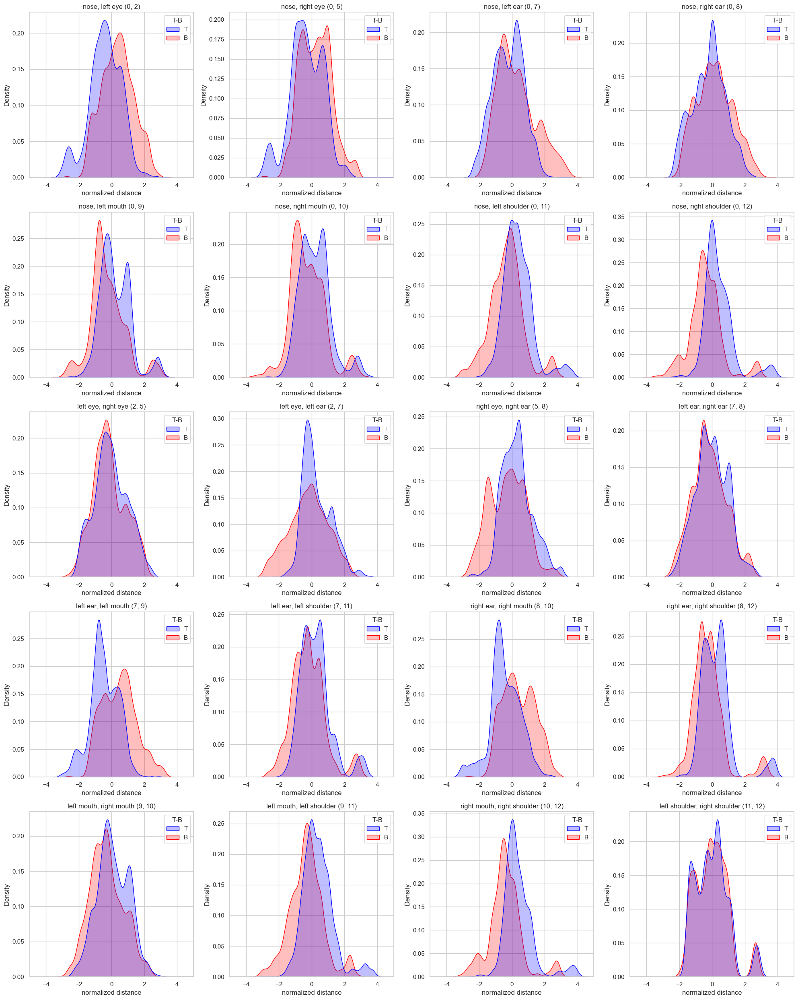

In [31]:
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # Adjusting the figure size for better readability
axs = axs.flatten()  # Flatten to iterate easily

max_feature_value = (df_f[features].max()).max()
max_x_axes = math.ceil(max_feature_value/10)*10
# Plotting
for i, feature in enumerate(df_f[features]):  # Excluding the label column
    #sns.histplot(data=df, x=feature, hue="action",  ax=axs[i], kde=True, bins = 20)
    sns.kdeplot(data=df_f, x=feature, hue="T-B", ax=axs[i], fill=True)  # fill=True for area under the KDE
  
    axs[i].set_title(feature_descriptions[features[i]]+' '+ str(feature))
    axs[i].set_xlabel("normalized distance")
    axs[i].set_xlim(-5, 5)

# Hide the empty subplots if less then 20
for i in range(len(features), 20):
    fig.delaxes(axs[i])

plt.savefig(str(graph_path / Path('normalized_distributions-T-B.png')))

plt.tight_layout()
plt.show()


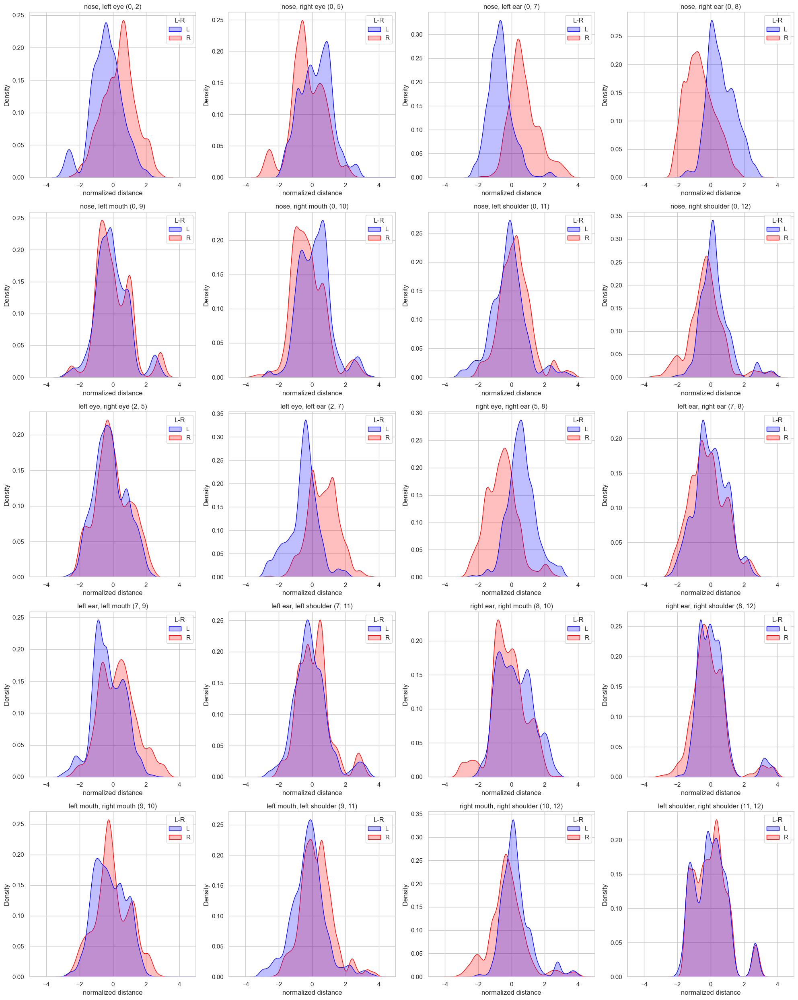

In [32]:
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # Adjusting the figure size for better readability
axs = axs.flatten()  # Flatten to iterate easily

max_feature_value = (df_f[features].max()).max()
max_x_axes = math.ceil(max_feature_value/10)*10
# Plotting
for i, feature in enumerate(df_f[features]):  # Excluding the label column
    #sns.histplot(data=df, x=feature, hue="action",  ax=axs[i], kde=True, bins = 20)
    sns.kdeplot(data=df_f, x=feature, hue="L-R", ax=axs[i], fill=True)  # fill=True for area under the KDE
  
    axs[i].set_title(feature_descriptions[features[i]]+' '+ str(feature))
    axs[i].set_xlabel("normalized distance")
    axs[i].set_xlim(-5, 5)

# Hide the empty subplots if less then 20
for i in range(len(features), 20):
    fig.delaxes(axs[i])

plt.savefig(str(graph_path / Path('normalized_distributions-L-R.png')))

plt.tight_layout()
plt.show()